# Integration

**Import**

In [1]:
# from second tutorial notebook (Part02)
import scanpy as sc
import pandas as pd
import scvelo as scv
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import ipywidgets as widgets

# others
import re
import os

# first tutorial
import bbknn
import diffxpy.api as dxpy
import plotly.express as px

# Meritxell's
import anndata2ri

In [2]:
# Meritxell's normalization
# Activate the anndata2ri conversion between SingleCellExperiment and AnnData
anndata2ri.activate()

#Loading the rpy2 extension enables cell magic to be used
#This runs R code in jupyter notebook cells
%load_ext rpy2.ipython

sc.settings.verbosity = 3
#sc.logging.print_versions()

In [3]:
bon_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/BON/cluster_adata.h5ad'
chimp_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/CHIMP/cluster_adata.h5ad' 
gor_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/GOR/cluster_adata.h5ad'
mac_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/MAC/cluster_adata.h5ad'
hum_path = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/HUM/cluster_adata.h5ad'

In [4]:
bon = sc.read(bon_path)
chimp = sc.read(chimp_path)
gor = sc.read(gor_path)
mac = sc.read(mac_path)
hum = sc.read(hum_path)

In [5]:
bon

AnnData object with n_obs × n_vars = 5043 × 25535
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'DATASET_colors', 'DE_leiden', 'DE_leiden_celltype', 'hvg', 'leiden', 'leiden_R.1_colors', 'leiden_R.2_colors', 'leiden_R.3_colors', 'neighbors', 'pca', 'spermatogenesis_

In [6]:
bon.obs['species']='bon'
chimp.obs['species']='chimp'
gor.obs['species']='gor'
mac.obs['species']='mac'
hum.obs['species']='hum'

In [7]:
bon.obs['species']

SN219_AAACCTGAGAAAGTGG    bon
SN219_AAACCTGAGGCGCTCT    bon
SN219_AAACCTGAGTCGCCGT    bon
SN219_AAACCTGCAGCGTTCG    bon
SN219_AAACCTGGTAAGAGAG    bon
                         ... 
SN224_TTTGTCAAGGGATCTG    bon
SN224_TTTGTCAAGTGAACGC    bon
SN224_TTTGTCACAGTAGAGC    bon
SN224_TTTGTCACATCCTTGC    bon
SN224_TTTGTCATCCGCAGTG    bon
Name: species, Length: 5043, dtype: object

In [8]:
merged = bon.concatenate(chimp)

In [9]:
merged

AnnData object with n_obs × n_vars = 21293 × 25353
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types', 'species', 'leiden_R.4'
    var: 'feature_types', 'chromosome', 'gene_ids-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_umap'
    layers: 'no

In [10]:
merged = merged.concatenate(gor)

In [11]:
merged = merged.concatenate(mac)

In [12]:
merged = merged.concatenate(hum)

In [13]:
merged = sc.read('/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/merged_adata.h5ad')

In [14]:
category_order=['Undif. SG','Dif. SG','SC.I','SC.II','Early round SD','Late round SD','Elong. SD','Sertoli']

In [15]:
palette_dict = {"Undif. SG":'lightblue',"Dif. SG":'blue',"SC.I":'lightgreen','SC.II':'green','Early round SD':'yellow','Late round SD':'orange','Elong. SD':'red','Sertoli':'pink','Macrophage':'brown'}

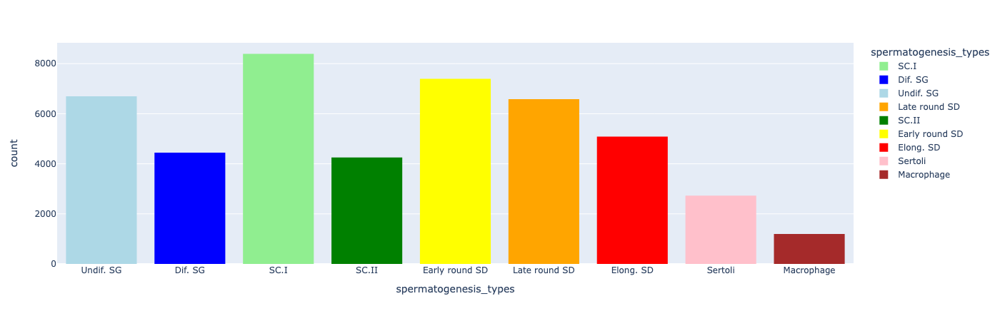

In [16]:
fig = px.histogram(merged.obs['spermatogenesis_types'], x='spermatogenesis_types', color='spermatogenesis_types', color_discrete_map=palette_dict)
fig.update_layout(
    xaxis=dict(
        categoryorder='array',
        categoryarray=category_order   
    ),
    autosize=False,
    width=800,
    #bargap=0.1,
    #bargroupgap=0.1
)
fig.show()

In [17]:
merged.X = merged.layers['raw_counts'].copy() # raw counts matrix as default

In [18]:
merged.X

array([[0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [1.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       ...,
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 1.      , 0.      ],
       [1.5     , 0.      , 0.666667, ..., 0.      , 0.      , 0.      ]],
      dtype=float32)

In [19]:
merged.layers['norm_sct']

array([[-0.38624061, -0.11852944, -0.12604581, ..., -0.17378488,
        -0.08765947, -0.32689791],
       [ 3.37791163, -0.10156935, -0.11268939, ..., -0.13910251,
        -0.074139  , -0.28549243],
       [-0.52358889, -0.18076913, -0.17449822, ..., -0.30137505,
        -0.13673458, -0.47723768],
       ...,
       [-0.64616885, -0.35659267, -0.3500357 , ..., -1.71793412,
        -0.6390978 , -1.58339863],
       [-0.41238667, -0.25243207, -0.22941105, ..., -1.49997995,
         5.4050304 , -1.37393625],
       [ 0.64783157, -0.39073874,  1.38546934, ..., -1.78099892,
        -0.67802806, -1.64582601]])

In [20]:
merged

AnnData object with n_obs × n_vars = 46782 × 20350
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types', 'leiden_R.4', 'leiden_R.5', 'species'
    var: 'feature_types', 'chromosome', 'gene_ids-Bon', 'n_cells-Bon', 'highly_variable-Bon', 'means-Bon', 'dispersions-Bon', 'dispersions_norm-Bon', 'gene_ids-Chimp', 'n_cells-Chimp', 'highly_variable-Chimp', 'means-Chimp', 'dispersions-Chimp', 'dispersions_norm-

In [21]:
#rawMatrix = merged.X.todense().T
rawMatrix = merged.X.T # T switch axis of cells and genes
cells = merged.obs_names
genes = merged.var_names
dataset = np.array(merged.obs["DATASET"])

In [22]:
rawMatrix.shape

(20350, 46782)

In [23]:
# normalization with all species combined
# "vars.to.regress" is still batch, it includes species now 

In [24]:
%%R -i rawMatrix -i cells -i genes -i dataset -o norm_sct -o umi_corr -o genes_var

library(Seurat)
colnames(rawMatrix) <- cells
rownames(rawMatrix) <- genes
meta <- data.frame(DATASET = dataset)  # add batch as metadata
print(dim(rawMatrix))
seurat_df <- CreateSeuratObject(rawMatrix)
seurat_df <- AddMetaData(seurat_df, meta$DATASET, col.name = "DATASET")
# scTransform
seurat_df <- SCTransform(seurat_df, verbose = TRUE, variable.features.n = length(genes), vars.to.regress = c("DATASET"), return.only.var.genes=FALSE) # normalize data with Negative binomial regression
# Get matrix of residuals
norm_sct <- GetAssayData(seurat_df,assay="SCT",slot="scale.data") # assign normalized and scaled data (not 0 mean scaling)
umi_corr <- GetAssayData(seurat_df,assay="SCT",slot="counts")
genes_var <- rownames(seurat_df$SCT)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: Attaching SeuratObject



[1] 20350 46782


R[write to console]: Calculating cell attributes from input UMI matrix: log_umi

R[write to console]: Variance stabilizing transformation of count matrix of size 20350 by 46782

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells



  |======================================================================| 100%


R[write to console]: Found 14 outliers - those will be ignored in fitting/regularization step


R[write to console]: Second step: Get residuals using fitted parameters for 20350 genes



  |======================================================================| 100%


R[write to console]: Computing corrected count matrix for 20350 genes



  |======================================================================| 100%


R[write to console]: Calculating gene attributes

R[write to console]: Wall clock passed: Time difference of 4.30613 mins

R[write to console]: Determine variable features

R[write to console]: Place corrected count matrix in counts slot

R[write to console]: Regressing out DATASET

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |                                                                      |   1%
  |                                                                            
  |=                                                                     |   1%
  |                                                                            
  |=                                                                     |   2%
  |                                                                         

In [25]:
merged.var_names = ["-".join(x.split("_")) for x in merged.var_names] # change _ in gene names to - so it works in R code
merged = merged[:,np.array(genes_var)].copy() # only use genes ...
# creating SCT layers in anndata object
merged.layers["norm_sct"] = norm_sct.T
merged.layers["umi_corr"] = umi_corr.T

In [26]:
merged.X = merged.layers['norm_sct'].copy()

In [3]:
merged = sc.read('/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/merged_norm_adata.h5ad')

In [4]:
merged

AnnData object with n_obs × n_vars = 46782 × 20350
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Undif. SG_score', 'Dif. SG_score', 'Lept. SC_score', 'Zyg. SC_score', 'Pach.Dipl. SC_score', 'Early round SD_score', 'Late round SD_score', 'Elong SD_score', 'SC_score', 'SC.I_score', 'SC.II_score', 'leiden_R.3', 'leiden_R.2', 'leiden_R.1', 'spermatogenesis_types', 'leiden_R.4', 'leiden_R.5', 'species'
    var: 'feature_types', 'chromosome', 'gene_ids-Bon', 'n_cells-Bon', 'highly_variable-Bon', 'means-Bon', 'dispersions-Bon', 'dispersions_norm-Bon', 'gene_ids-Chimp', 'n_cells-Chimp', 'highly_variable-Chimp', 'means-Chimp', 'dispersions-Chimp', 'dispersions_norm-

In [5]:
sc.pp.highly_variable_genes(merged, n_top_genes=10000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:15)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [6]:
sc.tl.pca(merged)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:48)


In [7]:
merged.uns['pca']

{'params': {'zero_center': True, 'use_highly_variable': True},
 'variance': array([196.76278006, 130.69648639,  65.48893649,  63.60150761,
         39.91271737,  37.80050291,  29.68843961,  26.15570337,
         22.59242327,  19.30690966,  17.30508577,  16.64506615,
         15.20338338,  14.36574451,  12.83182098,  12.75520395,
         11.60050538,  11.09684966,  10.99710539,  10.15384935,
          9.97285425,   9.73816942,   9.21533871,   8.89793982,
          8.49729068,   8.07906621,   7.83443984,   7.51084025,
          7.11817287,   6.74919149,   6.5520827 ,   6.37702885,
          6.04742987,   5.99661226,   5.7399739 ,   5.6240868 ,
          5.49078345,   5.28168682,   5.20886331,   5.02683707,
          4.89770211,   4.75547837,   4.69709872,   4.48416464,
          4.46831668,   4.37083199,   4.34667745,   4.28492668,
          4.12122957,   4.05564492]),
 'variance_ratio': array([0.01896605, 0.01259789, 0.00631251, 0.00613058, 0.0038472 ,
        0.00364361, 0.00286168, 0

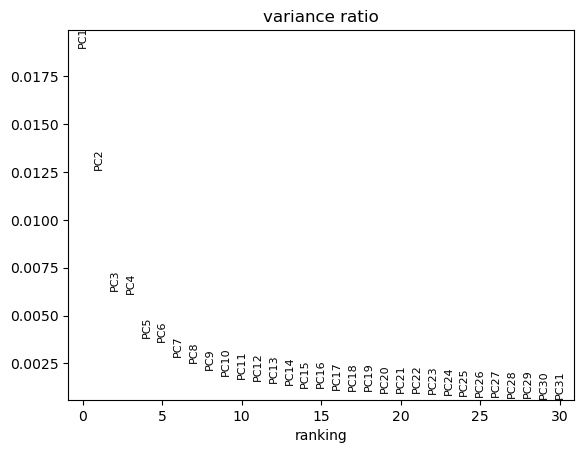

In [8]:
sc.plotting.pca_variance_ratio(merged) # small variance means it probably models noice in the data

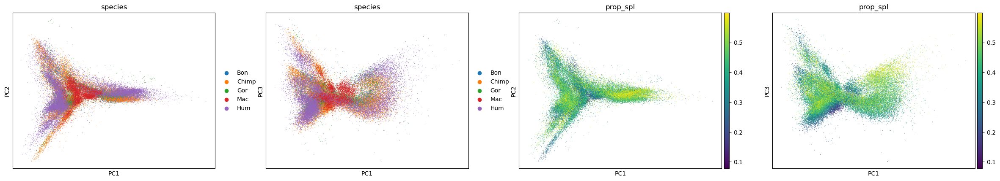

In [20]:
sc.pl.pca(merged, color=['species','prop_spl'], components=['1,2','1,3'])

In [28]:
bbknn.bbknn(merged, batch_key='species', n_pcs=20, neighbors_within_batch=2)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [29]:
sc.tools.umap(merged, random_state=54321)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:29)


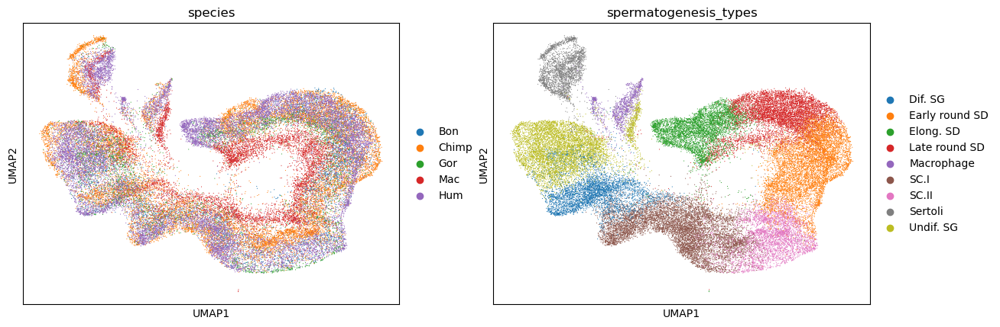

In [30]:
# batch_key = species
sc.plotting.umap(merged, color=['species','spermatogenesis_types'])

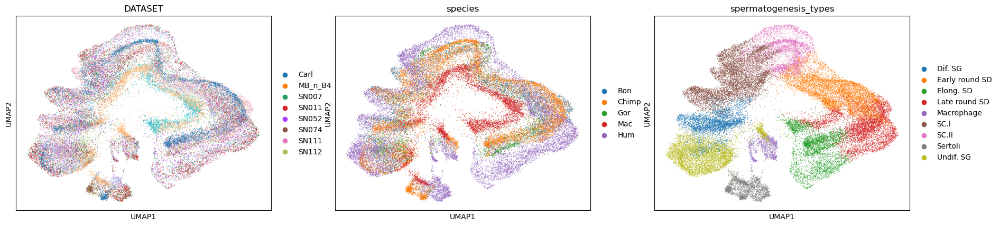

In [42]:
# batch_key = dataset
sc.plotting.umap(merged, color=['DATASET','species','spermatogenesis_types'])

In [5]:
%run /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/Scripts/pythonScripts.py

In [6]:
# markers in article and course mixed
markers = dict() #make an empty dictionary
#markers['SpermatogoniaB'] = ['MKI67','DMRT1','STRA8'] 
### SPERMATOCYTOGENESIS
markers['Undif. SG'] = ['ID4','HMGA1'] # course
markers['Dif. SG'] = ['MKI67','DMRT1','STRA8'] # course
markers['SC.I'] = ['MEIOB','PRSS50','SYCP1','TEX101'] # course
markers['SC.II'] = ['PIWIL1','ACRV1','SPATA16','CLGN'] # course
### SPERMIOGENESIS
markers['Early round SD'] = ['LRRIQ1'] #Round spermatids, Distinct #better than tutorial
markers['Late round SD'] = ['ACRV1','SPACA1'] #Round spermatids, Distinct #better than tutorial
markers['Elong SD'] = ['SPATA3','NRBP1','PRM1','GABBR2'] #Elongated spermatids #better than tutorial
### SOMATIC CELLS
markers['Sertoli'] = ['CLU'] # very distinct #better than tutorial
markers['Macroph'] = ['APOE','CD74']
markers['Leydig'] = ['STAR','CYP11A1']
markers['Endothelial'] = ['CD34'] #'TM4SF1' not expressed

In [7]:
markers_scores, merged = marker_score(markers, merged)

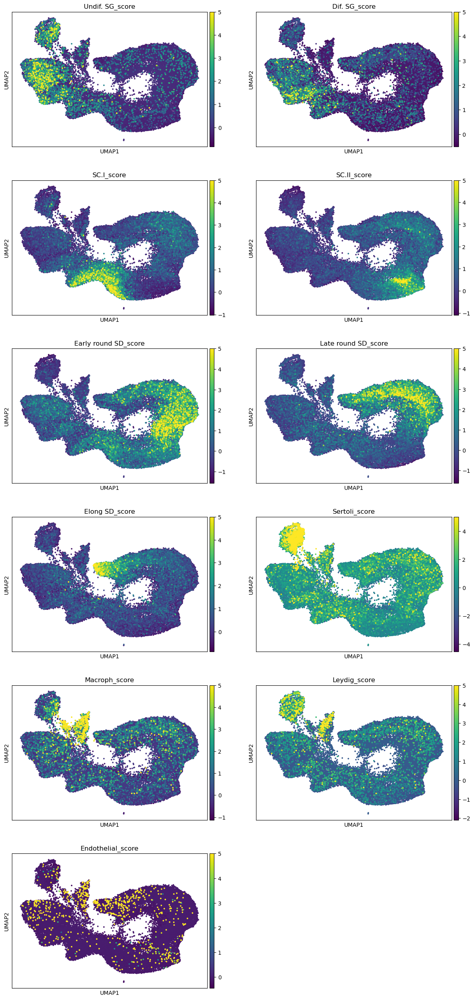

In [8]:
sc.plotting.umap(merged, color=markers_scores, components=['1,2'], ncols=2, vmax=5, s=30)

In [12]:
#leiden clustering at various resolutions
sc.tools.leiden(merged, resolution=0.5, random_state=12345, key_added='leiden_R.5')
sc.tools.leiden(merged, resolution=0.4, random_state=12345, key_added='leiden_R.4')
sc.tools.leiden(merged, resolution=0.3, random_state=12345, key_added='leiden_R.3')
sc.tools.leiden(merged, resolution=0.2, random_state=12345, key_added='leiden_R.2')
sc.tools.leiden(merged, resolution=0.1, random_state=12345, key_added='leiden_R.1')

running Leiden clustering
    finished: found 10 clusters and added
    'leiden_R.5', the cluster labels (adata.obs, categorical) (0:00:05)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_R.4', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_R.3', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_R.2', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_R.1', the cluster labels (adata.obs, categorical) (0:00:03)


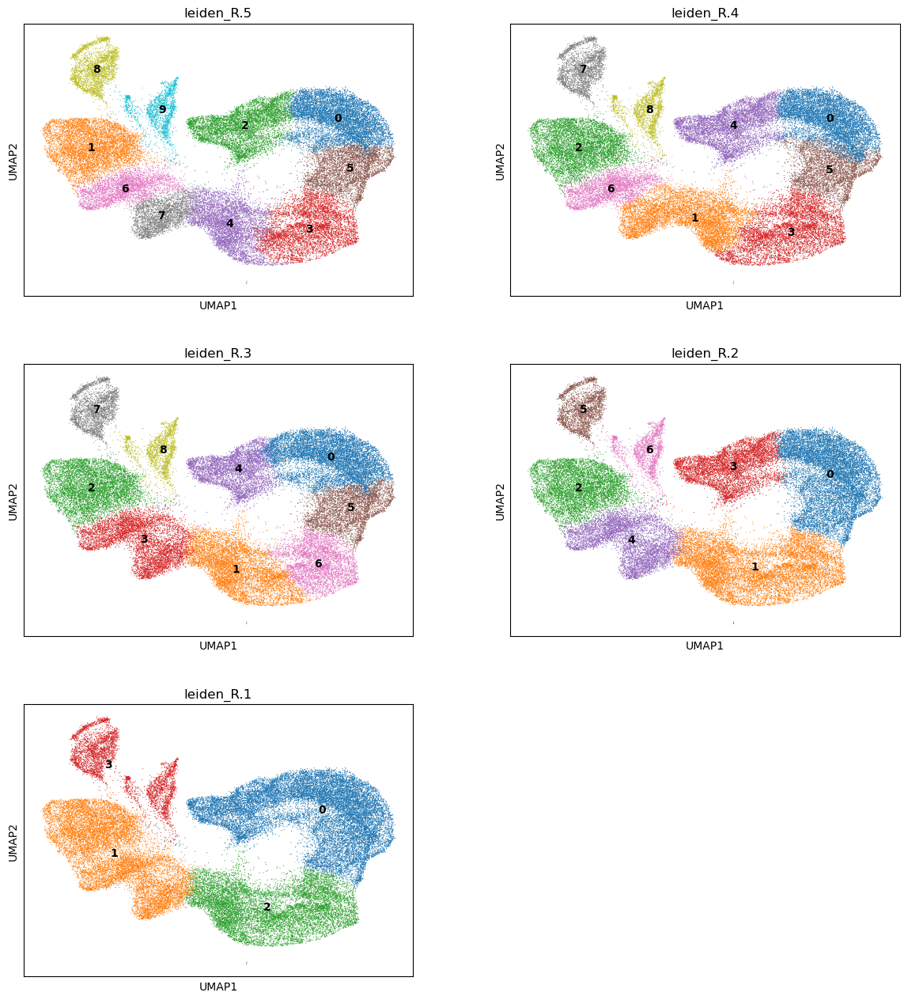

In [13]:
sc.plotting.umap(merged, color=['leiden_R.5','leiden_R.4','leiden_R.3','leiden_R.2','leiden_R.1'], legend_loc='on data', ncols=2)

In [15]:
sc.tl.rank_genes_groups(merged, groupby='leiden_R.4', n_genes=50, key_added='DE_leiden') # diff.expressed genes in each cluster (t-test)

ranking genes
    finished: added to `.uns['DE_leiden']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:26)


In [17]:
merged.uns['DE_leiden']

{'params': {'groupby': 'leiden_R.4',
  'reference': 'rest',
  'method': 't-test',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CNBD1', 'TTC28', 'PARD3', 'DPY19L2', 'FAM229A', 'LRRIQ1', 'AUTS2', 'ERBB4', 'MALAT1'),
            ('COL25A1', 'HORMAD1', 'MTUS2', 'STRBP', 'C20orf144', 'TTC29', 'UBE2E2', 'GPC5', 'TSHZ2'),
            ('IQCM', 'SYCP1', 'NALF1', 'ANKRD30A', 'CCDC168', 'MAPK10', 'SPIDR', 'CARMIL1', 'NEAT1'),
            ('TSBP1', 'AGBL4', 'NRG3', 'ANKRD62', 'HMGB4', 'PACRG', 'amplicon-chrX-GAGE10/1/2A/13/12B/12C/12D/12E/12F/12G/12H/12J', 'ZBTB20', 'RBMS3'),
            ('LRBA', 'SMC1B', 'CALN1', 'C1QTNF3', 'PPP2R2B', 'CNBD1', 'JMJD1C', 'SYNE2', 'DCN'),
            ('STXBP5-AS1', 'SCMH1', 'NLGN1', 'ANKRD20A1', 'TMEM191B', 'SPAG16', 'HELLS', 'ARL15', 'IGFBP7'),
            ('SLC44A5', 'LOC105373554', 'BMPR1B', 'ANKRD30B', 'SIRT2', 'KCNT2', 'STAG1', 'SYNE1', 'MIR99AHG'),
            ('PSD3', 'LINC01572', 'AFF3', 'ANKRD36C', 'FA

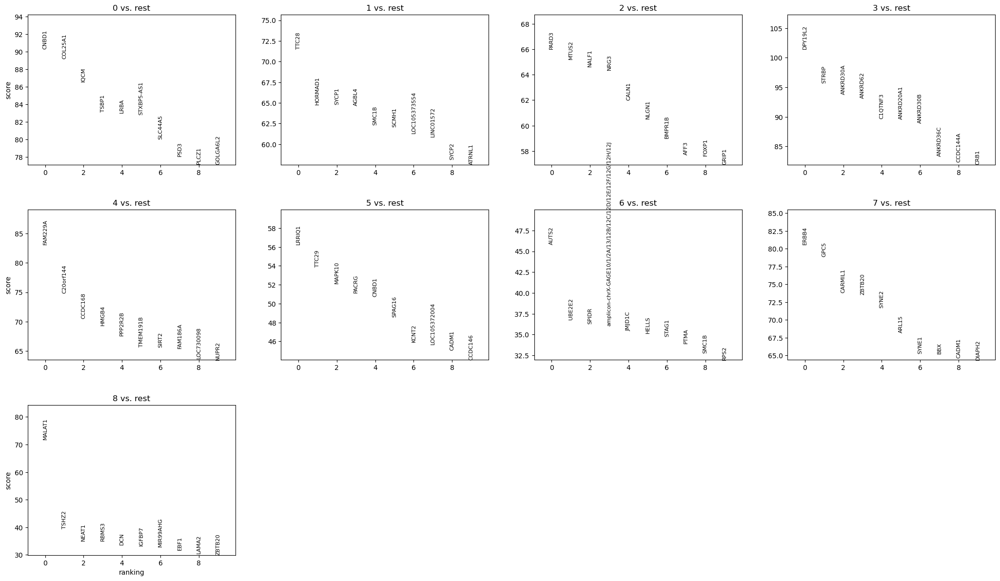

In [18]:
sc.pl.rank_genes_groups(merged, n_genes=10, groupby='leiden_R.4', key='DE_leiden', sharey=False) # sharey=False to change y axis to individual score

Organize result in a table. Each column has the cluster numbers with _N, _P representing respectively the gene Names and their P-values

In [19]:
result = merged.uns['DE_leiden']
groups = result['names'].dtype.names
X = pd.DataFrame(
    {group + '_' + key[:1].upper(): result[key][group]
    for group in groups for key in ['names', 'pvals_adj']})
X.head() #print only first five lines

,0_N,0_P,1_N,1_P,2_N,2_P,3_N,3_P,4_N,4_P,5_N,5_P,6_N,6_P,7_N,7_P,8_N,8_P
0,CNBD1,0.0,TTC28,0.0,PARD3,0.0,DPY19L2,0.0,FAM229A,0.0,LRRIQ1,0.0,AUTS2,0.000000e+00,ERBB4,0.0,MALAT1,0.000000e+00
1,COL25A1,0.0,HORMAD1,0.0,MTUS2,0.0,STRBP,0.0,C20orf144,0.0,TTC29,0.0,UBE2E2,9.598932e-250,GPC5,0.0,TSHZ2,1.378061e-244
2,IQCM,0.0,SYCP1,0.0,NALF1,0.0,ANKRD30A,0.0,CCDC168,0.0,MAPK10,0.0,SPIDR,2.108449e-243,CARMIL1,0.0,NEAT1,5.439176e-204
3,TSBP1,0.0,AGBL4,0.0,NRG3,0.0,ANKRD62,0.0,HMGB4,0.0,PACRG,0.0,amplicon-chrX-GAGE10/1/2A/13/12B/12C/12D/12E/1...,6.144484e-240,ZBTB20,0.0,RBMS3,7.696970e-204
4,LRBA,0.0,SMC1B,0.0,CALN1,0.0,C1QTNF3,0.0,PPP2R2B,0.0,CNBD1,0.0,JMJD1C,6.378911e-235,SYNE2,0.0,DCN,3.941538e-191


In [22]:
pd.DataFrame(merged.uns['DE_leiden']['names']).head() # top 5 ranked genes for each cluster

,0,1,2,3,4,5,6,7,8
0,CNBD1,TTC28,PARD3,DPY19L2,FAM229A,LRRIQ1,AUTS2,ERBB4,MALAT1
1,COL25A1,HORMAD1,MTUS2,STRBP,C20orf144,TTC29,UBE2E2,GPC5,TSHZ2
2,IQCM,SYCP1,NALF1,ANKRD30A,CCDC168,MAPK10,SPIDR,CARMIL1,NEAT1
3,TSBP1,AGBL4,NRG3,ANKRD62,HMGB4,PACRG,amplicon-chrX-GAGE10/1/2A/13/12B/12C/12D/12E/1...,ZBTB20,RBMS3
4,LRBA,SMC1B,CALN1,C1QTNF3,PPP2R2B,CNBD1,JMJD1C,SYNE2,DCN


In [24]:
cd /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results

/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results


In [25]:
X.to_csv('expr_annotation.csv', sep=',', index=None)

In [34]:
# cell type names for the chosen clusters

#new_names = {
#    '0':'SpermatogoniaA.1',
#    '1':'SpermatogoniaA.2',
#    '2':'Myoid',
#    '3':'Endothelial',
#    '4':'Leydig',
#    '5':'SpermatogoniaB',
#    '6':'Elong_Spermatids',
#    '7':'SpermatocitesII.1',
#    '8':'SpermatocitesII.2',
#    '9':'Round_Spermatids',
#    '10':'SpermatocitesI',
#    '11':'Macroph',
#    '12':'Pericytes'}


new_names = {
    '0':'Late round SD',
    '1':'SC.I',
    '2':'Undif. SG',
    '3':'SC.II',
    '4':'Elong. SD',
    '5':'Early round SD',
    '6':'Dif. SG',
    '7':'Sertoli',
    '8':'Macrophage'
}


We merge the clusters with same names. This cannot be done with a categorical object, where categories cannot have the same name. We convert the cluster names into a simple array to do this, and then reconvert it to a categorical object.

In [35]:
merged.obs['spermatogenesis_types_integration'] = [new_names[x] for x in merged.obs['leiden_R.4'].tolist()]

In [36]:
palette_dict = {"Undif. SG":'lightblue',"Dif. SG":'blue',"SC.I":'lightgreen','SC.II':'green','Early round SD':'yellow','Late round SD':'orange','Elong. SD':'red','Sertoli':'pink','Macrophage':'brown'}

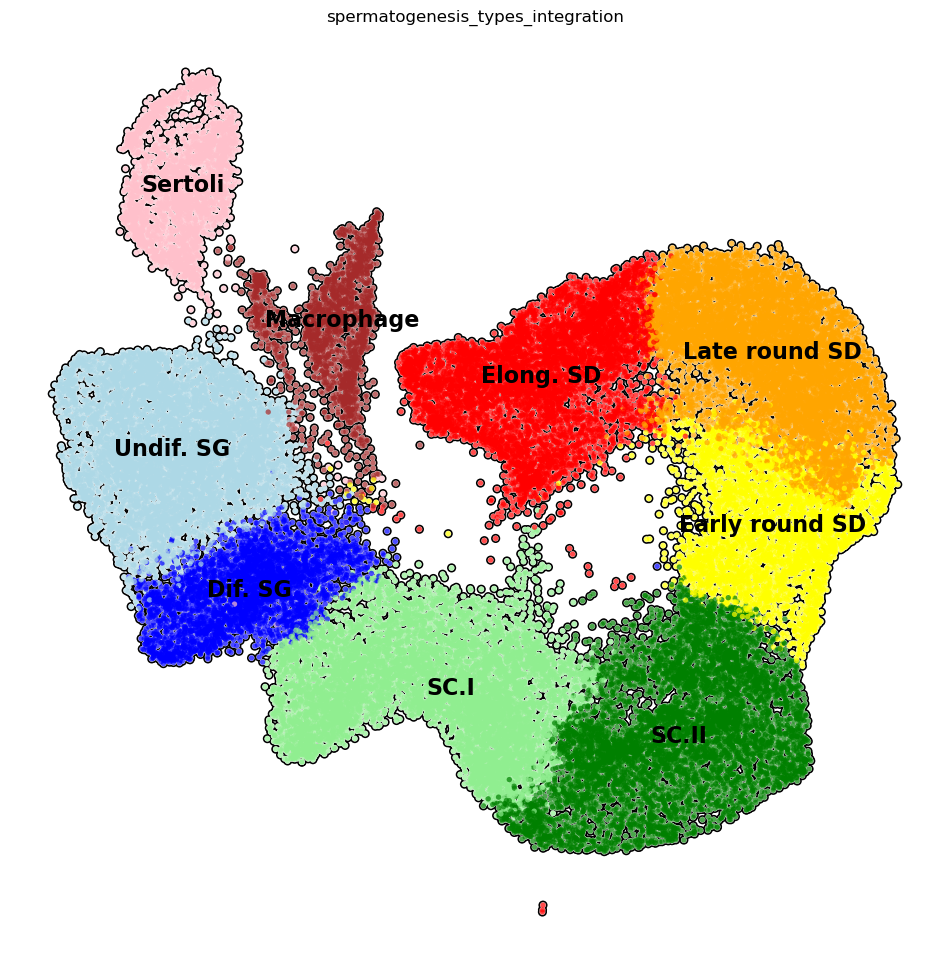

In [37]:
plt.rcParams['figure.figsize'] = (12,12)
sc.pl.umap( merged, color=['spermatogenesis_types_integration'],
           palette=palette_dict,
           legend_loc='on data', 
           legend_fontsize=16,
           frameon=False,
           size=60,
           add_outline=True,
           ncols=1  
           )

In [3]:
saved_adata = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/BON/cluster_adata.h5ad'
adata = sc.read(saved_adata)

In [38]:
sc.tl.rank_genes_groups(merged, groupby='spermatogenesis_types_integration', n_genes=50, key_added='DE_leiden_celltype_integration') # diff.expressed genes in each cluster (t-test)

ranking genes
    finished: added to `.uns['DE_leiden_celltype_integration']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:26)


In [39]:
merged.obs['spermatogenesis_types_integration']

SN219_AAACCTGAGAAAGTGG-Bon             SC.I
SN219_AAACCTGAGGCGCTCT-Bon          Dif. SG
SN219_AAACCTGAGTCGCCGT-Bon        Undif. SG
SN219_AAACCTGCAGCGTTCG-Bon    Late round SD
SN219_AAACCTGGTAAGAGAG-Bon             SC.I
                                  ...      
SN142_TTTGTCAAGTGTTGAA-Hum        Elong. SD
SN142_TTTGTCACAAGTACCT-Hum          Sertoli
SN142_TTTGTCACATCGACGC-Hum        Undif. SG
SN142_TTTGTCATCATCTGTT-Hum       Macrophage
SN142_TTTGTCATCATGTCTT-Hum        Elong. SD
Name: spermatogenesis_types_integration, Length: 46782, dtype: category
Categories (9, object): ['Dif. SG', 'Early round SD', 'Elong. SD', 'Late round SD', ..., 'SC.I', 'SC.II', 'Sertoli', 'Undif. SG']

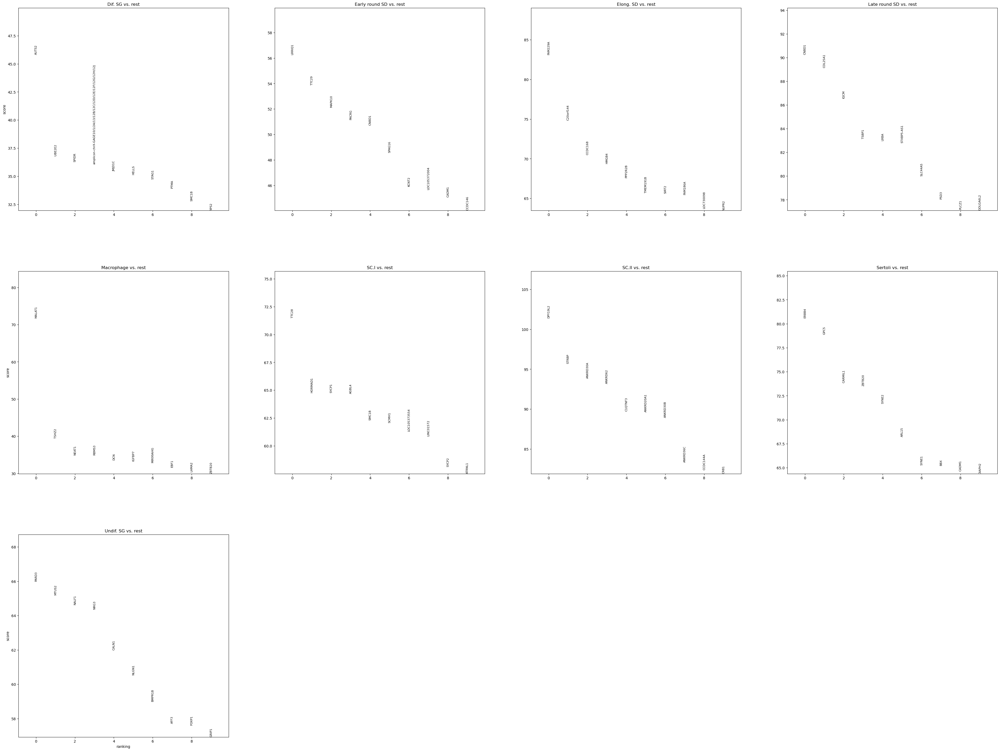

In [40]:
sc.pl.rank_genes_groups(merged, n_genes=10, groupby='spermatogenesis_types_integration', key='DE_leiden_celltype_integration', sharey=False) # sharey=False to change y axis to individual score

In [42]:
merged.uns['DE_leiden_celltype_integration']['names'].dtype.names

('Dif. SG',
 'Early round SD',
 'Elong. SD',
 'Late round SD',
 'Macrophage',
 'SC.I',
 'SC.II',
 'Sertoli',
 'Undif. SG')

In [43]:
result2 = merged.uns['DE_leiden_celltype_integration']
groups2 = result2['names'].dtype.names
X2 = pd.DataFrame(
    {group + '_' + key[:1].upper(): result2[key][group]
    for group in groups2 for key in ['names', 'pvals_adj']})
X2.head() #print only first five lines

,Dif. SG_N,Dif. SG_P,Early round SD_N,Early round SD_P,Elong. SD_N,Elong. SD_P,Late round SD_N,Late round SD_P,Macrophage_N,Macrophage_P,SC.I_N,SC.I_P,SC.II_N,SC.II_P,Sertoli_N,Sertoli_P,Undif. SG_N,Undif. SG_P
0,AUTS2,0.000000e+00,LRRIQ1,0.0,FAM229A,0.0,CNBD1,0.0,MALAT1,0.000000e+00,TTC28,0.0,DPY19L2,0.0,ERBB4,0.0,PARD3,0.0
1,UBE2E2,9.598932e-250,TTC29,0.0,C20orf144,0.0,COL25A1,0.0,TSHZ2,1.378061e-244,HORMAD1,0.0,STRBP,0.0,GPC5,0.0,MTUS2,0.0
2,SPIDR,2.108449e-243,MAPK10,0.0,CCDC168,0.0,IQCM,0.0,NEAT1,5.439176e-204,SYCP1,0.0,ANKRD30A,0.0,CARMIL1,0.0,NALF1,0.0
3,amplicon-chrX-GAGE10/1/2A/13/12B/12C/12D/12E/1...,6.144484e-240,PACRG,0.0,HMGB4,0.0,TSBP1,0.0,RBMS3,7.696970e-204,AGBL4,0.0,ANKRD62,0.0,ZBTB20,0.0,NRG3,0.0
4,JMJD1C,6.378911e-235,CNBD1,0.0,PPP2R2B,0.0,LRBA,0.0,DCN,3.941538e-191,SMC1B,0.0,C1QTNF3,0.0,SYNE2,0.0,CALN1,0.0


In [44]:
cd /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results

/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/results


In [45]:
X2.to_csv('cluster_results/expr_annotation_celltype_integration.csv', sep=',', index=None)

In [46]:
adata_out = '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/merged_norm_adata.h5ad'

In [47]:
merged.write(adata_out)